Data exploration

In [21]:
from pathlib import Path
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt

import seaborn as sns

In [42]:
import os

In [88]:
import random

In [22]:
DATA_DIR = Path(r"C:\Users\20223920\Documents\DS\25-26\Q4\Vak 1 4CBLW020 Addressing real-world crime and security problems with data science\Repro location\CBL_17_London\resources\data_full")

csv_files = list(DATA_DIR.rglob("*.csv"))

print(f"Amount of files found: {len(csv_files)}")

Amount of files found: 3007


In [23]:
for file in csv_files:

    print("\n" + "="*60)
    print(f"FILE: {file.name}")
    print("="*60)

    df = pd.read_csv(file, low_memory=False)

    print(df.head())
    print(df.info())

    if "crime_type" in df.columns:
        print(df["crime_type"].value_counts().head(10))


FILE: 2023-04-avon-and-somerset-stop-and-search.csv
                        Type                       Date  \
0              Person search  2023-04-01T01:39:03+00:00   
1              Person search  2023-04-01T01:39:03+00:00   
2  Person and Vehicle search  2023-04-01T02:12:20+00:00   
3              Person search  2023-04-01T02:46:48+00:00   
4              Person search  2023-04-01T05:09:57+00:00   

   Part of a policing operation  Policing operation   Latitude  Longitude  \
0                           NaN                 NaN  51.462846  -2.590141   
1                           NaN                 NaN  51.462846  -2.590141   
2                           NaN                 NaN  51.488289  -2.504212   
3                           NaN                 NaN  51.381429  -2.361617   
4                           NaN                 NaN  51.453850  -2.592874   

   Gender Age range                             Self-defined ethnicity  \
0    Male   over 34  White - English/Welsh/Scottish/Nor

In [24]:
stop_and_search_files = [
    file for file in csv_files
    if "stop-and-search" in file.name
]

street_files = [
    file for file in csv_files
    if "street" in file.name
]

print(len(stop_and_search_files), len(street_files))

1446 1561


In [25]:
stop_and_search_dfs = []

for file in stop_and_search_files:

    df = pd.read_csv(file, low_memory=False)

    df.columns = (
        df.columns
        .str.lower()
        .str.replace(" ", "_")
        .str.replace("-", "_")
    )

    stop_and_search_dfs.append(df)

    print(file.name)
    print(list(df.columns))
    print(len(df.columns))

2023-04-avon-and-somerset-stop-and-search.csv
['type', 'date', 'part_of_a_policing_operation', 'policing_operation', 'latitude', 'longitude', 'gender', 'age_range', 'self_defined_ethnicity', 'officer_defined_ethnicity', 'legislation', 'object_of_search', 'outcome', 'outcome_linked_to_object_of_search', 'removal_of_more_than_just_outer_clothing']
15
2023-04-bedfordshire-stop-and-search.csv
['type', 'date', 'part_of_a_policing_operation', 'policing_operation', 'latitude', 'longitude', 'gender', 'age_range', 'self_defined_ethnicity', 'officer_defined_ethnicity', 'legislation', 'object_of_search', 'outcome', 'outcome_linked_to_object_of_search', 'removal_of_more_than_just_outer_clothing']
15
2023-04-btp-stop-and-search.csv
['type', 'date', 'part_of_a_policing_operation', 'policing_operation', 'latitude', 'longitude', 'gender', 'age_range', 'self_defined_ethnicity', 'officer_defined_ethnicity', 'legislation', 'object_of_search', 'outcome', 'outcome_linked_to_object_of_search', 'removal_of_m

In [26]:
expected_columns_sas = [
    'type',
    'date',
    'part_of_a_policing_operation',
    'policing_operation',
    'latitude',
    'longitude',
    'gender',
    'age_range',
    'self_defined_ethnicity',
    'officer_defined_ethnicity',
    'legislation',
    'object_of_search',
    'outcome',
    'outcome_linked_to_object_of_search',
    'removal_of_more_than_just_outer_clothing'
]

In [27]:
consistent_files_sas = 0

for df in stop_and_search_dfs:

    column_names = list(df.columns)

    if column_names == expected_columns_sas:
        consistent_files_sas += 1

print(consistent_files_sas)

1446


No inconsistent column names found

In [28]:
street_dfs = []

for file in street_files:

    df = pd.read_csv(file, low_memory=False)

    df.columns = (
        df.columns
        .str.lower()
        .str.replace(" ", "_")
        .str.replace("-", "_")
    )

    street_dfs.append(df)

    print(file.name)
    print(list(df.columns))
    print(len(df.columns))

2023-04-avon-and-somerset-street.csv
['crime_id', 'month', 'reported_by', 'falls_within', 'longitude', 'latitude', 'location', 'lsoa_code', 'lsoa_name', 'crime_type', 'last_outcome_category', 'context']
12
2023-04-bedfordshire-street.csv
['crime_id', 'month', 'reported_by', 'falls_within', 'longitude', 'latitude', 'location', 'lsoa_code', 'lsoa_name', 'crime_type', 'last_outcome_category', 'context']
12
2023-04-btp-street.csv
['crime_id', 'month', 'reported_by', 'falls_within', 'longitude', 'latitude', 'location', 'lsoa_code', 'lsoa_name', 'crime_type', 'last_outcome_category', 'context']
12
2023-04-cambridgeshire-street.csv
['crime_id', 'month', 'reported_by', 'falls_within', 'longitude', 'latitude', 'location', 'lsoa_code', 'lsoa_name', 'crime_type', 'last_outcome_category', 'context']
12
2023-04-cheshire-street.csv
['crime_id', 'month', 'reported_by', 'falls_within', 'longitude', 'latitude', 'location', 'lsoa_code', 'lsoa_name', 'crime_type', 'last_outcome_category', 'context']
12
2

In [29]:
expected_columns_street = [
    'crime_id',
    'month',
    'reported_by',
    'falls_within',
    'longitude',
    'latitude',
    'location',
    'lsoa_code',
    'lsoa_name',
    'crime_type',
    'last_outcome_category',
    'context'
]

In [30]:
consistent_files_street = 0

for df in street_dfs:

    column_names = list(df.columns)

    if column_names == expected_columns_street:
        consistent_files_street += 1

print(consistent_files_street)

1561


No inconsistent column names found

In [65]:
street_df_full_raw = pd.concat(street_dfs, ignore_index=True)
street_df_full_raw.head()

,crime_id,month,reported_by,falls_within,longitude,latitude,location,lsoa_code,lsoa_name,crime_type,last_outcome_category,context
0,ac0fb28f06bce9a4fcc65f7e8975f91c44a78d22a3659f...,2023-04,Avon and Somerset Constabulary,Avon and Somerset Constabulary,-2.513516,51.408799,On or near Lincoln Close,E01014399,Bath and North East Somerset 001A,Criminal damage and arson,Status update unavailable,NaN
1,cc4df5b4b1fa99f0d06ee1e482f8489fe34f4052c6db6a...,2023-04,Avon and Somerset Constabulary,Avon and Somerset Constabulary,-2.492876,51.422716,On or near Trajectus Way,E01014399,Bath and North East Somerset 001A,Other theft,Status update unavailable,NaN
2,ed25a3872ae553669e31b96b83dcb1874a44f7ea9b68b8...,2023-04,Avon and Somerset Constabulary,Avon and Somerset Constabulary,-2.508867,51.416147,On or near St Francis Road,E01014399,Bath and North East Somerset 001A,Public order,Unable to prosecute suspect,NaN
3,77598bd69f2891bc3ddbe71cc067bc5deedc95b024bb20...,2023-04,Avon and Somerset Constabulary,Avon and Somerset Constabulary,-2.511746,51.409957,On or near Caernarvon Close,E01014399,Bath and North East Somerset 001A,Public order,Unable to prosecute suspect,NaN
4,703dbb104b161b493eca37c2e279e06712898d3610e8fb...,2023-04,Avon and Somerset Constabulary,Avon and Somerset Constabulary,-2.510372,51.423406,On or near Durley Lane,E01014399,Bath and North East Somerset 001A,Vehicle crime,Unable to prosecute suspect,NaN


In [32]:
missing_matrix = street_df_full_raw.isna()

In [67]:
sample = street_df_full_raw.sample(n=1000, random_state=42)
missing_matrix_sample = sample.isna()

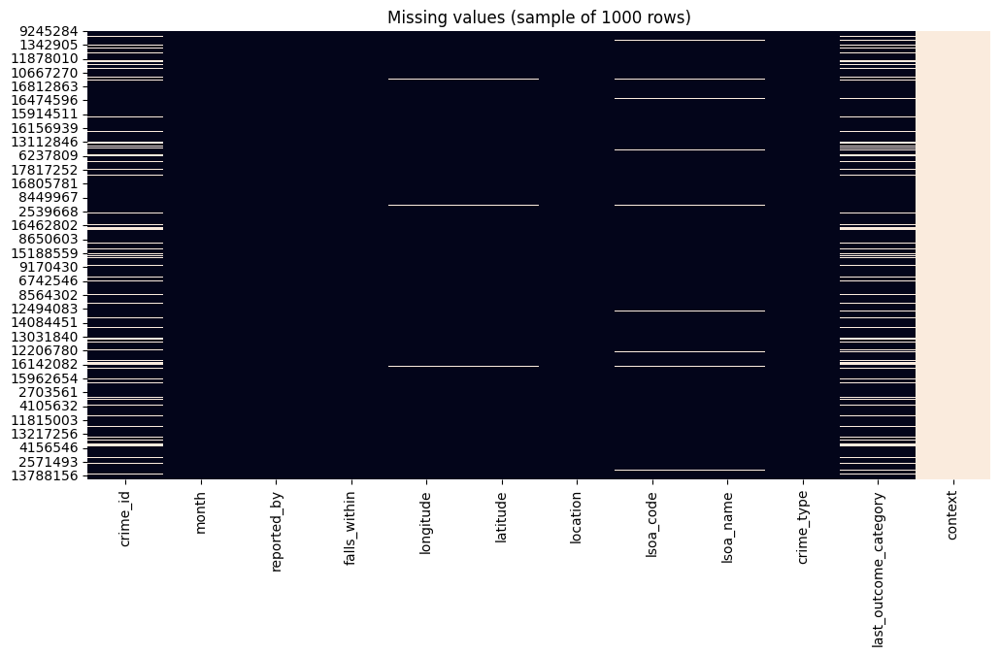

In [68]:
plt.figure(figsize=(12,6))
sns.heatmap(missing_matrix_sample, cbar=False)

plt.title("Missing values (sample of 1000 rows)")
plt.show()

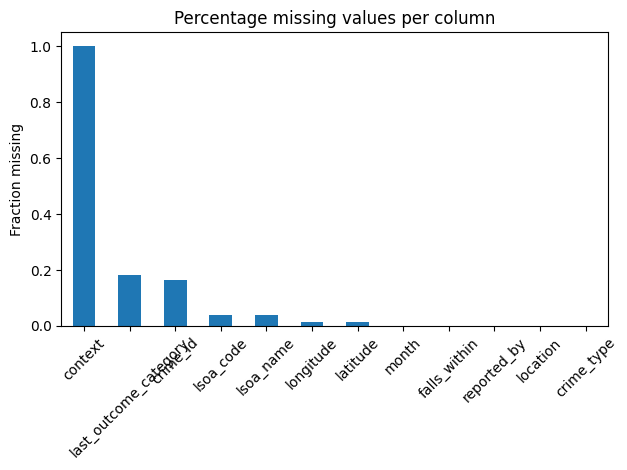

In [66]:
street_df_full_raw.isna().mean().sort_values(ascending=False).plot(kind="bar")

plt.title("Percentage missing values per column")
plt.ylabel("Fraction missing")
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [69]:
missing_counts = missing_matrix.sum()
missing_counts = missing_counts[missing_counts > 0]

print("Total rows:", len(street_df_full_raw))

for col, cnt in missing_counts.items():
    print(f"{col}: {cnt}")

Total rows: 17849542
crime_id: 2940213
longitude: 263597
latitude: 263597
lsoa_code: 686142
lsoa_name: 686142
last_outcome_category: 3230069
context: 17849542


In [70]:
street_df_full_raw = street_df_full_raw.dropna(subset=["lsoa_code"])

In [71]:
street_df_full_raw.head()

,crime_id,month,reported_by,falls_within,longitude,latitude,location,lsoa_code,lsoa_name,crime_type,last_outcome_category,context
0,ac0fb28f06bce9a4fcc65f7e8975f91c44a78d22a3659f...,2023-04,Avon and Somerset Constabulary,Avon and Somerset Constabulary,-2.513516,51.408799,On or near Lincoln Close,E01014399,Bath and North East Somerset 001A,Criminal damage and arson,Status update unavailable,NaN
1,cc4df5b4b1fa99f0d06ee1e482f8489fe34f4052c6db6a...,2023-04,Avon and Somerset Constabulary,Avon and Somerset Constabulary,-2.492876,51.422716,On or near Trajectus Way,E01014399,Bath and North East Somerset 001A,Other theft,Status update unavailable,NaN
2,ed25a3872ae553669e31b96b83dcb1874a44f7ea9b68b8...,2023-04,Avon and Somerset Constabulary,Avon and Somerset Constabulary,-2.508867,51.416147,On or near St Francis Road,E01014399,Bath and North East Somerset 001A,Public order,Unable to prosecute suspect,NaN
3,77598bd69f2891bc3ddbe71cc067bc5deedc95b024bb20...,2023-04,Avon and Somerset Constabulary,Avon and Somerset Constabulary,-2.511746,51.409957,On or near Caernarvon Close,E01014399,Bath and North East Somerset 001A,Public order,Unable to prosecute suspect,NaN
4,703dbb104b161b493eca37c2e279e06712898d3610e8fb...,2023-04,Avon and Somerset Constabulary,Avon and Somerset Constabulary,-2.510372,51.423406,On or near Durley Lane,E01014399,Bath and North East Somerset 001A,Vehicle crime,Unable to prosecute suspect,NaN


In [72]:
crime_lsoa_month = street_df_full_raw.groupby(
    ["lsoa_code", "lsoa_name", "month"]
).size().reset_index(name="crime_count")

In [73]:
crime_lsoa_month.head()

,lsoa_code,lsoa_name,month,crime_count
0,E01000001,City of London 001A,2023-04,12
1,E01000001,City of London 001A,2023-05,21
2,E01000001,City of London 001A,2023-06,18
3,E01000001,City of London 001A,2023-07,14
4,E01000001,City of London 001A,2023-08,14


In [101]:
street_df_full = street_df_full_raw.drop(
    columns=[
        "last_outcome_category",
        "context"
    ]
)

In [102]:
street_df_full.head()

,crime_id,month,reported_by,falls_within,longitude,latitude,location,lsoa_code,lsoa_name,crime_type
0,ac0fb28f06bce9a4fcc65f7e8975f91c44a78d22a3659f...,2023-04,Avon and Somerset Constabulary,Avon and Somerset Constabulary,-2.513516,51.408799,On or near Lincoln Close,E01014399,Bath and North East Somerset 001A,Criminal damage and arson
1,cc4df5b4b1fa99f0d06ee1e482f8489fe34f4052c6db6a...,2023-04,Avon and Somerset Constabulary,Avon and Somerset Constabulary,-2.492876,51.422716,On or near Trajectus Way,E01014399,Bath and North East Somerset 001A,Other theft
2,ed25a3872ae553669e31b96b83dcb1874a44f7ea9b68b8...,2023-04,Avon and Somerset Constabulary,Avon and Somerset Constabulary,-2.508867,51.416147,On or near St Francis Road,E01014399,Bath and North East Somerset 001A,Public order
3,77598bd69f2891bc3ddbe71cc067bc5deedc95b024bb20...,2023-04,Avon and Somerset Constabulary,Avon and Somerset Constabulary,-2.511746,51.409957,On or near Caernarvon Close,E01014399,Bath and North East Somerset 001A,Public order
4,703dbb104b161b493eca37c2e279e06712898d3610e8fb...,2023-04,Avon and Somerset Constabulary,Avon and Somerset Constabulary,-2.510372,51.423406,On or near Durley Lane,E01014399,Bath and North East Somerset 001A,Vehicle crime


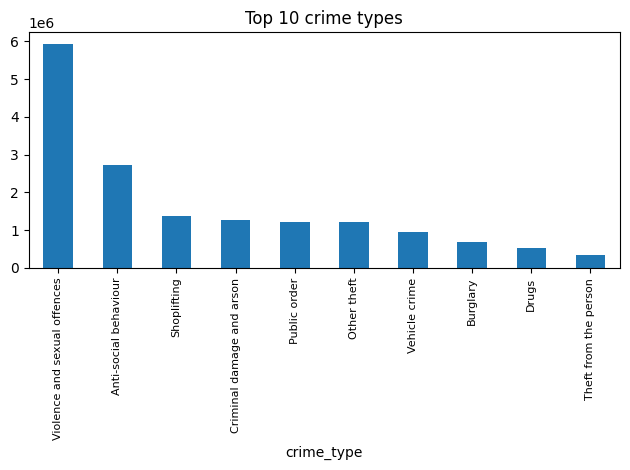

In [85]:
street_df_full_raw["crime_type"].value_counts().head(10).plot(kind="bar")

plt.title("Top 10 crime types")
plt.xticks(fontsize=8)
plt.tight_layout()
plt.show()

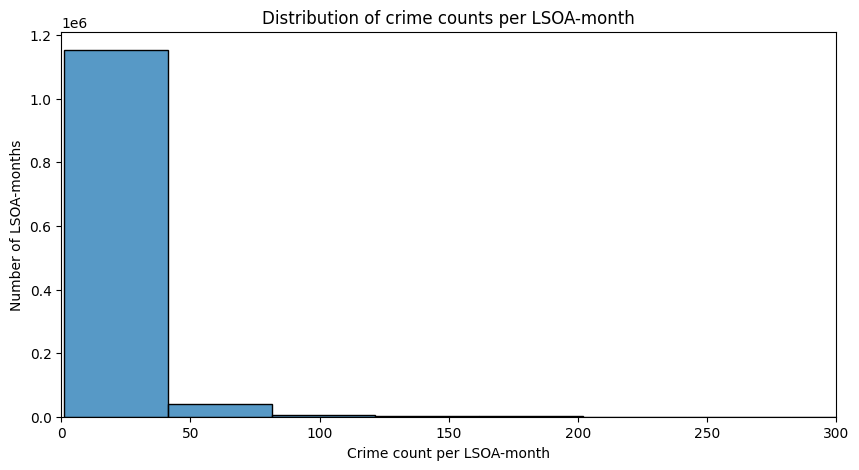

In [41]:
plt.figure(figsize=(10,5))
sns.histplot(crime_lsoa_month["crime_count"], bins=50)

plt.xlim(0, 300)
plt.title("Distribution of crime counts per LSOA-month")
plt.xlabel("Crime count per LSOA-month")
plt.ylabel("Number of LSOA-months")

plt.show()

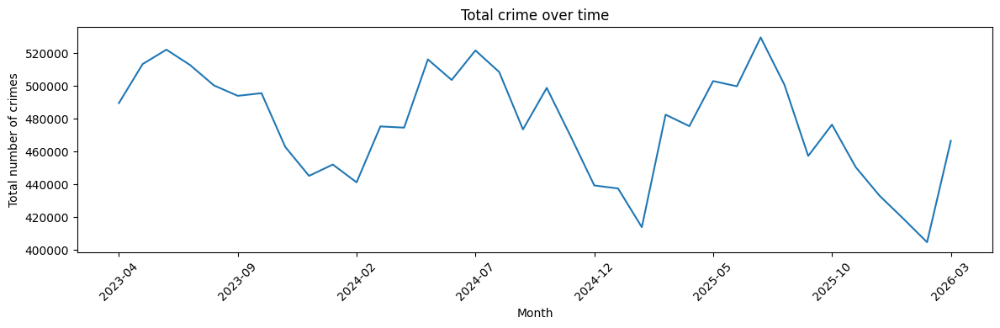

In [86]:
monthly_total = crime_lsoa_month.groupby("month")["crime_count"].sum()

monthly_total.plot(figsize=(12,4))

plt.title("Total crime over time")
plt.xlabel("Month")
plt.ylabel("Total number of crimes")

plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

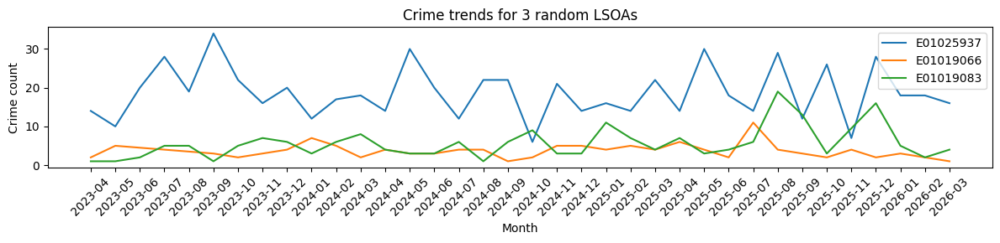

In [100]:
sample_lsoas = random.sample(
    list(crime_lsoa_month["lsoa_code"].unique()), 3
)

plt.figure(figsize=(12,3))

for lsoa in sample_lsoas:
    temp = crime_lsoa_month[crime_lsoa_month["lsoa_code"] == lsoa]
    temp = temp.sort_values("month")
    plt.plot(temp["month"], temp["crime_count"], label=lsoa)

plt.title("Crime trends for 3 random LSOAs")
plt.xlabel("Month")
plt.ylabel("Crime count")
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

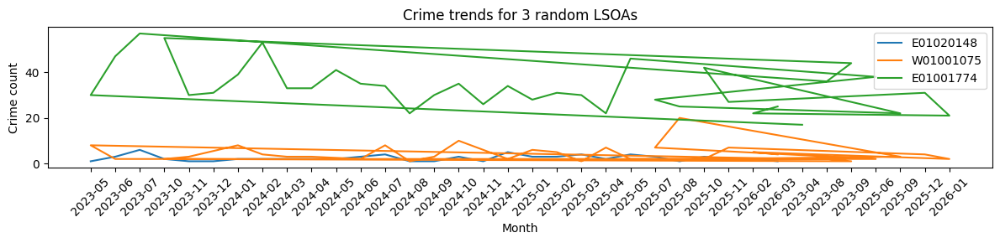

In [98]:
sample_lsoas = random.sample(
    list(crime_lsoa_month["lsoa_code"].unique()), 3
)

plt.figure(figsize=(12,3))

for lsoa in sample_lsoas:
    temp = crime_lsoa_month[crime_lsoa_month["lsoa_code"] == lsoa]
    temp = temp.sort_values("month")
    plt.plot(temp["month"], temp["crime_count"], label=lsoa)

plt.title("Crime trends for 3 random LSOAs")
plt.xlabel("Month")
plt.ylabel("Crime count")
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [105]:
street_events = street_df_full.drop(
    columns=[
        "location",
        "longitude",
        "latitude",
        "lsoa_name",
        "reported_by"
    ]
)

In [106]:
street_events.head()

,crime_id,month,falls_within,lsoa_code,crime_type
0,ac0fb28f06bce9a4fcc65f7e8975f91c44a78d22a3659f...,2023-04,Avon and Somerset Constabulary,E01014399,Criminal damage and arson
1,cc4df5b4b1fa99f0d06ee1e482f8489fe34f4052c6db6a...,2023-04,Avon and Somerset Constabulary,E01014399,Other theft
2,ed25a3872ae553669e31b96b83dcb1874a44f7ea9b68b8...,2023-04,Avon and Somerset Constabulary,E01014399,Public order
3,77598bd69f2891bc3ddbe71cc067bc5deedc95b024bb20...,2023-04,Avon and Somerset Constabulary,E01014399,Public order
4,703dbb104b161b493eca37c2e279e06712898d3610e8fb...,2023-04,Avon and Somerset Constabulary,E01014399,Vehicle crime


In [ ]:
os.makedirs("../resources", exist_ok=True) 

street_events.to_parquet( 
    "../resources/street_events.parquet", 
    index=False, 
    engine="pyarrow" 
    ) 
crime_lsoa_month.to_parquet( 
    "../resources/crime_lsoa_month.parquet", 
    index=False, 
    engine="pyarrow" 
    )